<a href="https://colab.research.google.com/github/OJB-Quantum/Monte-Carlo-Sim/blob/main/Transient_Monte_Carlo_2D_Cross_Sectional_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Below is a transient Monte Carlo 2D cross-sectional simulation for ion beam etching of a metal film with thickness (t)

Authored by Onri Jay Benally (2025)

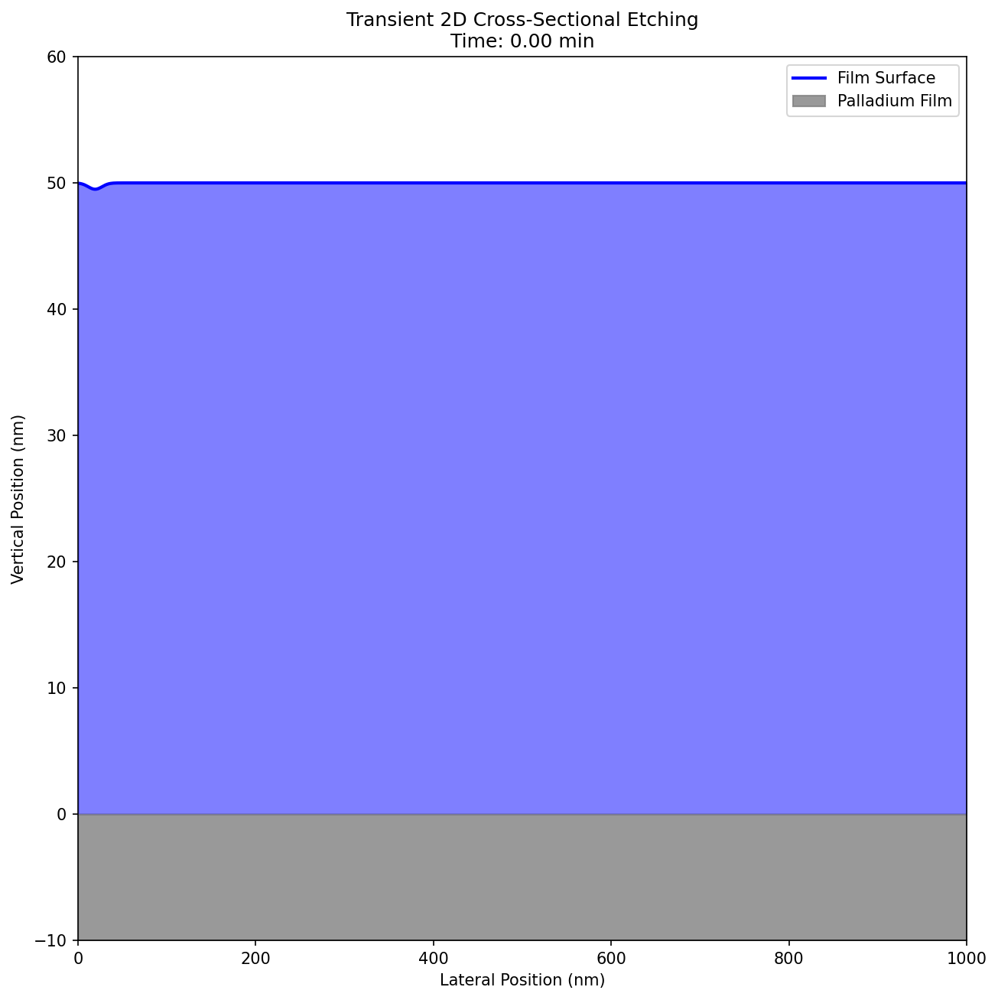

In [ ]:
# Monte Carlo Transient 2D Cross-Sectional Simulation of Ion Beam Etching
# for a 50 nm Palladium Film on a Substrate over a 10-minute Period
#
# Etch parameters:
#   - Incidence angle: 75° (from the surface normal)
#   - Ion beam voltage: 200 V
#   - Ion beam current: 70 mA (slow recipe)
#   - Acceleration voltage: 24 V
#   - Argon gas flow: 13 sccm
#
# In this simulation:
#   - The film’s surface is represented as a 1D height profile (film thickness vs lateral position).
#   - The substrate is fixed at y = 0 (gray area) and the film (blue) initially spans from y = 0 to y = 50 nm.
#   - Each ion impact randomly removes material with a Gaussian removal profile whose width is
#     increased to mimic the 75° incidence.
#   - The simulation is mapped to a 10-minute period (600 seconds).
#
# The animation uses matplotlib's FuncAnimation to show the etching evolution over time.

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Onri prefers using rcParams to increase the quality of all plots to be higher than the default settings.
# This only needs to be done once at beginning of every Jupyter Notebook.
plt.rcParams['figure.dpi'] = 150

# --- Simulation Grid and Initial Conditions ---
film_thickness = 50.0         # nm, initial film thickness
film_length = 1000.0          # nm, lateral length of simulation domain
dx = 1.0                      # nm, spatial resolution
n_points = int(film_length / dx)
x = np.linspace(0, film_length, n_points)

# Film's initial height profile (from substrate y = 0 up to 50 nm)
h_initial = np.ones(n_points) * film_thickness

# --- Etch Process Parameters ---
incidence_angle = 75          # degrees from the surface normal
ion_beam_voltage = 200        # V
ion_beam_current = 70         # mA (slow recipe)
acceleration_voltage = 24     # V
argon_flow_rate = 13          # sccm

# --- Monte Carlo Simulation Parameters ---
n_ions = 10000                # total number of ion impacts to simulate
yield_peak = 0.5              # nm removal at the center of the impact per ion
sigma = 2.0                   # nm, baseline width of the removal profile
# Effective sigma to mimic the grazing (75°) incidence (wider impact footprint)
sigma_eff = sigma / np.cos(np.radians(incidence_angle))

# Total simulation time: 10 minutes (600 seconds)
total_sim_time = 600.0  # seconds
dt = total_sim_time / n_ions  # time per ion impact (seconds)

def gaussian_removal(x_arr, center, yield_peak, sigma_eff):
    """Return the Gaussian removal profile for a given ion impact."""
    return yield_peak * np.exp(-((x_arr - center)**2) / (2 * sigma_eff**2))

def make_step(h, x):
    """
    Simulate one ion impact step and update the film height profile.

    Parameters:
      h : np.array
          Current height profile of the film.
      x : np.array
          Lateral positions corresponding to the height profile.

    Returns:
      h_new : np.array
          Updated height profile after the ion impact.
    """
    impact_position = np.random.uniform(0, film_length)
    removal = gaussian_removal(x, impact_position, yield_peak, sigma_eff)
    h_new = np.maximum(h - removal, 0)  # ensure film thickness does not go below 0
    return h_new

# --- Transient Simulation Data Capture ---
capture_interval = 100        # Capture the profile every 100 ion impacts
frames = []                   # List to store snapshots of the height profile
current_h = h_initial.copy()

for i in range(n_ions):
    current_h = make_step(current_h, x)
    if i % capture_interval == 0:
        frames.append(current_h.copy())

# --- Animation: Creating a 2D Cross-Section Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(0, film_length)
ax.set_ylim(-10, film_thickness + 10)  # extra space below substrate and above film

# Initial plot: film surface (blue line) and substrate (gray fill)
film_line, = ax.plot(x, frames[0], color='blue', lw=2)
ax.fill_between(x, -10, 0, color='grey', alpha=0.8)
ax.set_xlabel("Lateral Position (nm)")
ax.set_ylabel("Vertical Position (nm)")
ax.set_title("Transient 2D Cross-Sectional Etching\nTime: 0.00 min")
ax.legend(["Film Surface", "Palladium Film", "Substrate"])

def update(frame_index):
    """Update function for animation."""
    h_profile = frames[frame_index]
    film_line.set_ydata(h_profile)
    # Remove previous fill_between collections (if any) by removing each collection object
    for coll in ax.collections[:]:
        coll.remove()
    # Redraw film fill (blue) and substrate (gray)
    ax.fill_between(x, h_profile, color='blue', alpha=0.5)
    ax.fill_between(x, -10, 0, color='grey', alpha=0.8)

    # Calculate elapsed simulation time based on ion impacts and convert to minutes
    elapsed_seconds = frame_index * capture_interval * dt
    elapsed_minutes = elapsed_seconds / 60.0
    ax.set_title(f"Transient 2D Cross-Sectional Etching\nTime: {elapsed_minutes:.2f} min")
    return film_line,

# Create the animation using FuncAnimation
anim = FuncAnimation(fig, update, frames=len(frames), interval=100, blit=False)

# Display the animation inline in Google Colab
HTML(anim.to_jshtml())

# Look for the play button and press play to animate the cross-sectional view of the dry etching.

Monte Carlo (MC) simulations overview:

| Aspect                             | Description                                                                                                                                                            |
|------------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Purpose of MC Simulation**       | Predict etch profiles, roughness evolution, sputtering yields, and ion-material interactions for metal films with thickness (**t**).                                    |
| **Typical MC Simulation Steps**    | 1. Ion trajectory tracking.<br>2. Modeling sputtering yields.<br>3. Predicting etched profile evolution and roughness.                                                 |
| **Ion Trajectory Tracking**        | Tracks ions' incident angles, energies, collisions, and scattering events using models such as Binary Collision Approximation (BCA).                                    |
| **Surface Evolution**              | Updates surface topography iteratively based on sputtering, simulating the evolution of roughness and etched profiles over time.                                       |
| **Analysis Outcomes**              | Provides cross-sectional profiles, roughness evolution, sputtering yields, and depth-lateral resolution.                                                               |
| **Key Simulation Steps**           | 1. Initialization of film thickness and ion parameters<br>2. Trajectory simulation<br>3. Surface update iteration<br>4. Analysis of final etched profiles and roughness. |
| **Popular MC Tools**               | - **SRIM/TRIM**: General ion-material interactions<br>- **IM3D**: Specialized for ion milling simulations<br>- **SDTrimSP**: Advanced sputtering and surface evolution.  |
| **Practical Simulation Outcomes**  | - Etching rate predictions<br>- Cross-sectional profile accuracy<br>- Surface roughness metrics<br>- Optimization of ion-beam parameters for precise etching.           |

Some open-access, peer-reviewed articles relevant to Monte Carlo simulations in thin film processing and semiconductor fabrication:

| Title                                                                                             | Authors                                      | Year | Source                                                                                                                         |
|---------------------------------------------------------------------------------------------------|----------------------------------------------|------|--------------------------------------------------------------------------------------------------------------------------------|
| Monte Carlo Methods for Simulating Thin Film Deposition                                          | Michael J. Miksis, Petia M. Vlahovska        | 2005 | [SpringerLink](https://link.springer.com/chapter/10.1007/978-1-4020-3286-8_123)                                                |
| Monte Carlo Simulation for Electron Dynamics in Semiconductor Devices                            | J. Faricelli, G. Iannaccone, M. Macucci      | 2000 | [MDPI](https://www.mdpi.com/2297-8747/10/1/19)                                                                                 |
| Monte Carlo Simulation of Polycrystalline Thin Film Deposition                                   | F. Family, P. Meakin                         | 2000 | [Physical Review B](https://link.aps.org/doi/10.1103/PhysRevB.63.035406)                                                       |
| Monte Carlo and Kinetic Monte Carlo Models for Deposition Processes: A Review                    | M. Kotrla, P. Šmilauer                       | 2021 | [Frontiers in Physics](https://www.frontiersin.org/articles/10.3389/fphy.2021.631918/full)                                     |
| Molecular Dynamics—Monte Carlo Hybrid Simulation of Thin Film Growth and Void Formation in Electrodeposition Process | S. K. Sinha, S. K. Sinha, S. K. Sinha | 2006 | [Molecular Simulation](https://www.tandfonline.com/doi/full/10.1080/08927020601052930)                                         |
| A Monte Carlo Simulation Study of Substrate Effect on AB Type Thin Film Growth                   | İzzet Paruğ Duru, Şahin Aktaş                | 2012 | [arXiv](https://arxiv.org/abs/1210.4419)                                                                                        |
| Thin Film Growth by Using Random Shape Cluster Deposition                                        | ZH. Ebrahiminejad, Seyed Farhad Masoudi, R. S. Dariani, Saeed S. Jahromi | 2012 | [arXiv](https://arxiv.org/abs/1205.3956) |

Some open-access, peer-reviewed articles for metal thin film etching related to Monte Carlo simulation:

| Title                                                                                             | Authors                                      | Year | Source                                                                                                                         |
|---------------------------------------------------------------------------------------------------|----------------------------------------------|------|--------------------------------------------------------------------------------------------------------------------------------|
| Optimization of the Monte Carlo Simulation for Sapphire in Wet Etching                            | Wu, G., Li, Y., Qian, J., & Miao, X.          | 2023 | [MDPI Coatings](https://www.mdpi.com/2079-6412/13/6/981)                                                                        |
| Monte Carlo and Kinetic Monte Carlo Models for Deposition Processes: A Review                     | Kotrla, M., & Šmilauer, P.                   | 2021 | [Frontiers in Physics](https://www.frontiersin.org/articles/10.3389/fphy.2021.631918/full)                                      |
| Monte Carlo Simulation of Polycrystalline Thin Film Deposition                                    | Bruschi, P., Nannini, A., & Pieri, F.        | 2000 | [Physical Review B](https://link.aps.org/doi/10.1103/PhysRevB.63.035406)                                                        |
| Predicting Structure Zone Diagrams for Thin Film Synthesis by Monte Carlo Simulation              | Abadias, G., Tse, Y. Y., & Gu, X.            | 2020 | [Nature Communications](https://www.nature.com/articles/s43246-020-0017-2)                                                      |
| The Kinetic Monte Carlo Method: Foundation, Implementation, and Application                       | Chatterjee, A., & Vlachos, D. G.             | 2007 | [Journal of Applied Physics](https://www.researchgate.net/publication/256917961_The_Kinetic_Monte_Carlo_method_Foundation_implementation_and_application) |